In [108]:
f_w_equivalence = open("./SorbetData/equivalence.ttl", "w", encoding="UTF-8")

with open("./Results/http:__dbpedia.org_ontology___TO__http:__wikidata.org_.ttl", "r", encoding="UTF-8") as f_r:
    f_w_onto = open("./SorbetData/db_TO_wk.ttl", "w", encoding="UTF-8")

    line = f_r.readline()
    line = f_r.readline()
    while line != "":
        print(line)
        s,p,o = line.split("> ")
        if p == "<http://www.w3.org/2002/07/owl#equivalentClass":
            f_w_equivalence.write(line)
        else:
            f_w_onto.write(line)
        line = f_r.readline()

    f_w_onto.close()
    
with open("./Results/http:__wikidata.org___TO__http:__dbpedia.org_ontology_.ttl", "r", encoding="UTF-8") as f_r:
    f_w_onto = open("./SorbetData/wk_TO_db.ttl", "w", encoding="UTF-8")
    
    line = f_r.readline()
    line = f_r.readline()
    while line != "":
        print(line)
        s,p,o = line.split("> ")
        if p == "<http://www.w3.org/2002/07/owl#equivalentClass":
            f_w_equivalence.write(o[:-1]+" "+p+"> "+s+">\n")
        else:
            f_w_onto.write(line)
        line = f_r.readline()

    f_w_onto.close()
    

<http://dbpedia.org/ontology/reservations> <http://www.w3.org/2000/01/rdf-schema#isDefinedBy> <http://dbpedia.org/ontology/>.

<http://dbpedia.org/ontology/reservations> <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://www.w3.org/1999/02/22-rdf-syntax-ns#Property>.

<http://dbpedia.org/ontology/reservations> <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://www.w3.org/2002/07/owl#DatatypeProperty>.

<http://dbpedia.org/ontology/reservations> <http://www.w3.org/2000/01/rdf-schema#label> "reservations"@en.

<http://dbpedia.org/ontology/numberOfNeighbourhood> <http://www.w3.org/2000/01/rdf-schema#isDefinedBy> <http://dbpedia.org/ontology/>.

<http://dbpedia.org/ontology/numberOfNeighbourhood> <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://www.w3.org/1999/02/22-rdf-syntax-ns#Property>.

<http://dbpedia.org/ontology/numberOfNeighbourhood> <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://www.w3.org/2002/07/owl#DatatypeProperty>.

<http://dbpedia.org/ontol

In [109]:

from subprocess import DEVNULL, STDOUT, check_call

In [110]:
cmd = f"java -jar rdf2rdf-1.3.0-jar-with-dependencies.jar "\
                +f"./SorbetData/db_TO_wk.ttl "\
                +f"./SorbetData/db_TO_wk.owl"
check_call(cmd, shell=True, stdout=DEVNULL, stderr=STDOUT)

0

In [111]:
cmd = f"java -jar rdf2rdf-1.3.0-jar-with-dependencies.jar "\
                +f"./SorbetData/wk_TO_db.ttl "\
                +f"./SorbetData/wk_TO_db.owl"
check_call(cmd, shell=True, stdout=DEVNULL, stderr=STDOUT)

0

In [140]:
d = {}
with open("./Results/http:__dbpedia.org_ontology___TO__http:__wikidata.org_.ttl", "r", encoding="UTF-8") as f_r:

    line = f_r.readline()
    line = f_r.readline()
    while line != "":
        s,p,o = line.split("> ")
        if p == "<http://www.w3.org/2000/01/rdf-schema#subClassOf":
            s = s[1:]
            o = o[1:-3]
            if not s in d:
                d[s] = set()
            d[s].add(o)
        line=f_r.readline()



In [141]:
{j for i in d.values() for j in i if not j in d}

{'http://cef.uv.es/lodroadtran18/def/transporte/dtx_srti#Geo_WGS84',
 'http://cef.uv.es/lodroadtran18/def/transporte/dtx_srti#ImportedClasses',
 'http://dbpedia.org/ontology/Agent',
 'http://dbpedia.org/ontology/AmusementParkAttraction',
 'http://dbpedia.org/ontology/ArchitecturalStructure',
 'http://dbpedia.org/ontology/Athlete',
 'http://dbpedia.org/ontology/Beverage',
 'http://dbpedia.org/ontology/BodyOfWater',
 'http://dbpedia.org/ontology/Case',
 'http://dbpedia.org/ontology/CelestialBody',
 'http://dbpedia.org/ontology/ChemicalSubstance',
 'http://dbpedia.org/ontology/Cleric',
 'http://dbpedia.org/ontology/CollectionOfValuables',
 'http://dbpedia.org/ontology/Company',
 'http://dbpedia.org/ontology/Competition',
 'http://dbpedia.org/ontology/Crater',
 'http://dbpedia.org/ontology/Department',
 'http://dbpedia.org/ontology/Device',
 'http://dbpedia.org/ontology/EducationalInstitution',
 'http://dbpedia.org/ontology/FloweringPlant',
 'http://dbpedia.org/ontology/Genre',
 'http://db

In [136]:
for i in d.values():
    for j in i :
        if j not in d:
            print(j)

http://dbpedia.org/ontology/Agent
http://dbpedia.org/ontology/Infrastructure
http://dbpedia.org/ontology/EducationalInstitution
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/MeanOfTransportation
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/SocietalEvent
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/CelestialBody
http://dbpedia.org/ontology/Infrastructure
http://dbpedia.org/ontology/ChemicalSubstance
http://dbpedia.org/ontology/Device
http://schema.org/Product
http://dbpedia.org/ontology/CelestialBody
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/WrittenWork
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/BodyOfWater
http://dbpedia.org/ontology/Project
http://dbpedia.org/ontology/ArchitecturalStructure
http://dbpedia.org/ontology/WrittenWork
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/NaturalPlace
http://www.w3.org/2002/07/owl#Thing
http://dbpedia.org/ontology/ArchitecturalStruct

In [137]:
d["http://dbpedia.org/ontology/Agent"]

KeyError: 'http://dbpedia.org/ontology/Agent'

In [121]:
import networkx as nx

In [124]:
G = nx.Graph()
for k in d:
    for v in d[k]:
        G.add_edge(k,v)

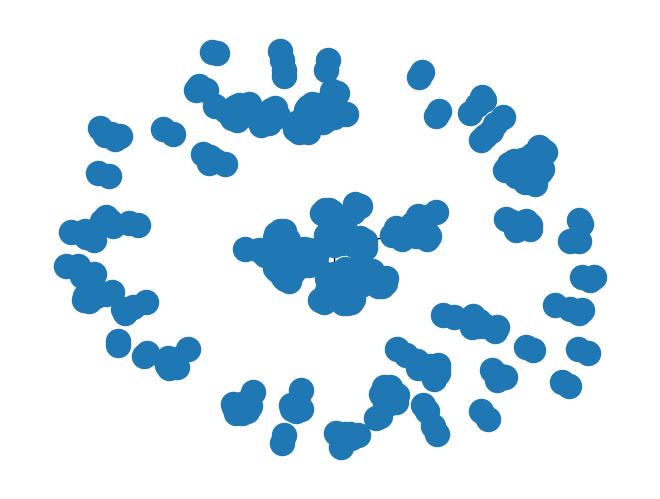

In [125]:
nx.draw(G)

In [126]:
[ len(i)  for i in list(nx.connected_components(G))]

[35,
 49,
 70,
 10,
 9,
 7,
 5,
 4,
 5,
 17,
 5,
 2,
 10,
 4,
 8,
 4,
 2,
 6,
 2,
 2,
 10,
 2,
 2,
 4,
 2,
 6,
 2,
 3,
 2,
 2,
 2,
 3,
 2,
 4,
 3,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2]

In [116]:
G2 = nx.DiGraph()
nodes_to_keep = list(nx.connected_components(G))[0]
for k in d:
    for v in d[k]:
        if (k in nodes_to_keep) and( v in nodes_to_keep):
            G2.add_edge(k,v)

NetworkXNotImplemented: not implemented for directed type

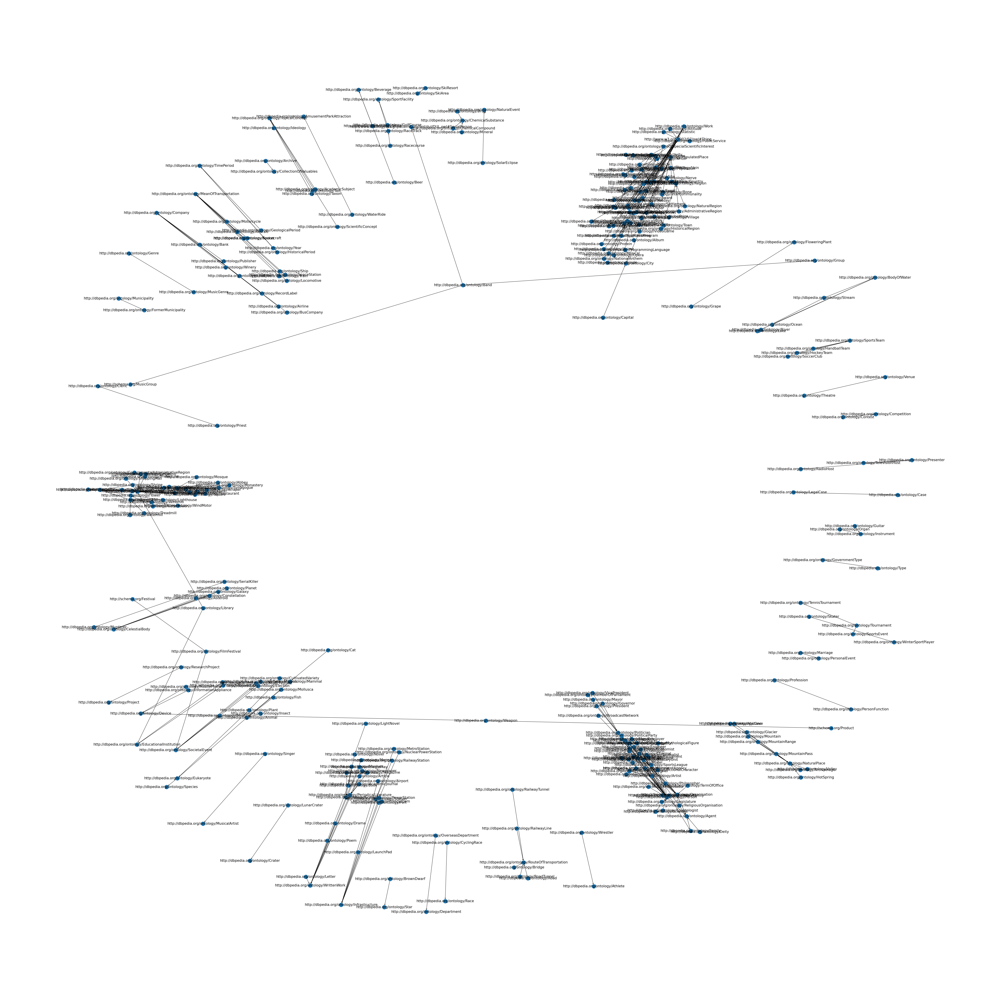

In [117]:
import matplotlib.pyplot as plt
import networkx as nx

f, axs = plt.subplots(1, 1, figsize=(60, 60))
pos = nx.spring_layout(G)  # positions for all nodes
nx.draw_networkx_edges(G, pos, width=1.0, alpha=1, 
    arrowstyle="->", arrowsize=10)
nx.draw_networkx_nodes(
    G,
    pos,
    alpha=1,
)
nx.draw_networkx_labels(G, pos, font_size=15)

plt.tight_layout()
plt.axis("off")
plt.show()

In [118]:
nx.is_arborescence(G)

False

In [45]:
list(nx.cycle_graph())[0]

TypeError: cycle_graph() missing 1 required positional argument: 'n'